In [146]:
from datetime import datetime
import pandas as pd
import numpy as np
import requests
import json
import re
from geopy.geocoders import Nominatim
from geopy import distance
pd.options.mode.chained_assignment = None
import seaborn as sns
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point, Polygon
from pylab import rcParams
from scipy import stats
%matplotlib inline

sns.set(style='whitegrid', palette='muted', font_scale=1.5)

rcParams['figure.figsize'] = 14, 8

In [147]:
lat = []
lng = []
address = []
price = []
postal = []
bathrooms= []
bedrooms = []
area = []
total_page = 51
url = "https://realtor-canadian-real-estate.p.rapidapi.com/properties/list-residential"
for page in range(1,(total_page + 1)):

    headers = {
    'x-rapidapi-key': "1c926bc8camshb7e051c044fd07ep1e1d63jsn48235fdac42f",
    'x-rapidapi-host': "realtor-canadian-real-estate.p.rapidapi.com"
    }
    querystring = {"CurrentPage":str(page),"LatitudeMin":"45.26","LongitudeMax":"-73.37","RecordsPerPage":"50","LongitudeMin":"-74.16","LatitudeMax":"45.72","BedRange":"0-0","BathRange":"0-0","NumberOfDays":"0","CultureId":"1","PriceMin":"100000","SortBy":"1","SortOrder":"A","RentMin":"0","BuildingTypeId":"1"}
    
    response = requests.request("GET", url, headers=headers, params=querystring)
    results = response.json()["Results"]
    for result in results:
        lng.append(result['Property']['Address']['Longitude'])
        lat.append(result['Property']['Address']['Latitude'])
        address.append(result['Property']['Address']['AddressText'])
        postal.append(result['PostalCode'])
        bathrooms.append(result['Building'].get('BathroomTotal', 0))
        bedrooms.append(result['Building'].get('Bedrooms', 0))
        price.append(result['Property']['Price'])
        area.append(result['Land'].get('SizeTotal'))



In [148]:
data = pd.DataFrame(
    {'Address': address,
     'Postal_Code': postal,
     'Latitude': lat,
     'Longitude': lng,
     "Bathrooms": bathrooms,
     "Bedrooms" : bedrooms,
     "Area" : area,
     "Price" : price
    })

In [149]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2500 entries, 0 to 2499
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Address      2500 non-null   object
 1   Postal_Code  2500 non-null   object
 2   Latitude     2500 non-null   object
 3   Longitude    2500 non-null   object
 4   Bathrooms    2500 non-null   object
 5   Bedrooms     2500 non-null   object
 6   Area         2367 non-null   object
 7   Price        2500 non-null   object
dtypes: object(8)
memory usage: 156.4+ KB


In [150]:
lat0 = []
lng0 = []
address0 = []
price0 = []
postal0 = []
bathrooms0= []
bedrooms0 = []
area0 = []
total_page = 50
url = "https://realtor-canadian-real-estate.p.rapidapi.com/properties/list-residential"
for page in range(1,(total_page + 1)):

    headers = {
    'x-rapidapi-key': "1c926bc8camshb7e051c044fd07ep1e1d63jsn48235fdac42f",
    'x-rapidapi-host': "realtor-canadian-real-estate.p.rapidapi.com"
    }
    querystring = {"CurrentPage":str(page),"LatitudeMin":"45.26","LongitudeMax":"-73.37","RecordsPerPage":"50","LongitudeMin":"-74.18","LatitudeMax":"45.72","BedRange":"0-0","BathRange":"0-0","NumberOfDays":"0","CultureId":"1","PriceMin":"500000","SortBy":"1","SortOrder":"A","RentMin":"0","BuildingTypeId":"1"}
    
    response = requests.request("GET", url, headers=headers, params=querystring)
    results = response.json()["Results"]
    for result in results:
        lng0.append(result['Property']['Address']['Longitude'])
        lat0.append(result['Property']['Address']['Latitude'])
        address0.append(result['Property']['Address']['AddressText'])
        postal0.append(result['PostalCode'])
        bathrooms0.append(result['Building'].get('BathroomTotal', 0))
        bedrooms0.append(result['Building'].get('Bedrooms', 0))
        price0.append(result['Property']['Price'])
        area0.append(result['Land'].get('SizeTotal'))


In [151]:
data0 = pd.DataFrame(
    {'Address': address0,
     'Postal_Code': postal0,
     'Latitude': lat0,
     'Longitude': lng0,
     "Bathrooms": bathrooms0,
     "Bedrooms" : bedrooms0,
     "Area" : area0,
     "Price" : price0
    })

In [152]:
df = pd.concat([data, data0], ignore_index=True)

In [153]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4491 entries, 0 to 4490
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Address      4491 non-null   object
 1   Postal_Code  4491 non-null   object
 2   Latitude     4491 non-null   object
 3   Longitude    4491 non-null   object
 4   Bathrooms    4491 non-null   object
 5   Bedrooms     4491 non-null   object
 6   Area         4237 non-null   object
 7   Price        4491 non-null   object
dtypes: object(8)
memory usage: 280.8+ KB


In [154]:
df = df.drop_duplicates()
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3167 entries, 0 to 4490
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Address      3167 non-null   object
 1   Postal_Code  3167 non-null   object
 2   Latitude     3167 non-null   object
 3   Longitude    3167 non-null   object
 4   Bathrooms    3167 non-null   object
 5   Bedrooms     3167 non-null   object
 6   Area         2997 non-null   object
 7   Price        3167 non-null   object
dtypes: object(8)
memory usage: 222.7+ KB


In [155]:
df["Address"] = df["Address"].apply(lambda x: x.replace('|',',')) #removing the | character in address extracted

df["City"] = df["Address"].str.split(',') #adding a column (City) using the address extracted

df['City'] = df["Address"].str.extract(r',\s*([^\.]*)\s*\,', expand=False)
df = df[df['Area'].notna()] # removing rows with nan values for area column
df.loc[df.Postal_Code == "H3Y1B3", ['Postal_Code']] = "J7V0K1" # 

In [156]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2997 entries, 0 to 4490
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Address      2997 non-null   object
 1   Postal_Code  2997 non-null   object
 2   Latitude     2997 non-null   object
 3   Longitude    2997 non-null   object
 4   Bathrooms    2997 non-null   object
 5   Bedrooms     2997 non-null   object
 6   Area         2997 non-null   object
 7   Price        2997 non-null   object
 8   City         2997 non-null   object
dtypes: object(9)
memory usage: 234.1+ KB


In [158]:
df.City.unique() # to create a dictionary of cities, and to see which cities extracted contain mistakes in their text

array(['Pointe-Calumet', 'Mirabel', 'Terrebonne (Terrebonne)',
       'Salaberry-de-Valleyfield', 'Sainte-Thérèse',
       "Notre-Dame-de-l'Île-Perrot", 'Beauharnois',
       'Sainte-Marthe-sur-le-Lac', 'Bois-des-Filion',
       'Laval (Sainte-Rose)', 'Saint-Eustache', 'Boisbriand',
       'Montréal (Lachine)', 'Saint-Constant', 'La Prairie',
       "Montréal (L'Île-Bizard/Sainte-Geneviève)", 'Laval (Laval-Ouest)',
       'Deux-Montagnes', 'Delson', 'Châteauguay', 'Mercier',
       'Laval (Auteuil)', 'Laval (Fabreville)', 'Laval (Saint-François)',
       'Longueuil (Saint-Hubert)', 'Montréal (Montréal-Nord)', 'Léry',
       'Pincourt', 'Pointe-des-Cascades', "L'Île-Perrot",
       'Sainte-Catherine', 'Vaudreuil-Dorion', 'Saint-Colomban',
       'Laval (Sainte-Dorothée)', 'Oka', 'Lorraine',
       'Repentigny (Repentigny)', 'Longueuil (Le Vieux-Longueuil)',
       'Terrebonne (Lachenaie)', 'Longueuil (Greenfield Park)',
       'Laval (Chomedey)', 'Montréal (Mercier/Hochelaga-Maisonneuve

In [161]:
#replacing names of cities with mistakes
df.loc[df.City == "#11,Boucherville", ['City']] = 'Boucherville'
df.loc[df.City == "#2,Brossard", ['City']] = 'Brossard'
df.loc[df.City == "#18,Montréal (Ville-Marie)", ['City']] = 'Montréal (Ville-Marie)'
df.loc[df.City == "#H,Notre-Dame-de-l'Île-Perrot", ['City']] = "Notre-Dame-de-l'Île-Perrot"
df.loc[df.City == "#A,Notre-Dame-de-l'Île-Perrot", ['City']] = "Notre-Dame-de-l'Île-Perrot"
df.loc[df.City == "#F,Notre-Dame-de-l'Île-Perrot", ['City']] = "Notre-Dame-de-l'Île-Perrot"
df.loc[df.City == "#D,Notre-Dame-de-l'Île-Perrot", ['City']] = "Notre-Dame-de-l'Île-Perrot"
df.loc[df.City == "#G,Notre-Dame-de-l'Île-Perrot", ['City']] = "Notre-Dame-de-l'Île-Perrot"
df.loc[df.City == "#B,Notre-Dame-de-l'Île-Perrot", ['City']] = "Notre-Dame-de-l'Île-Perrot"
df.loc[df.City == "#E,Notre-Dame-de-l'Île-Perrot", ['City']] = "Notre-Dame-de-l'Île-Perrot"
df.loc[df.City == "#C,Montréal (Ville-Marie)", ['City']] = 'Montréal (Ville-Marie)'
df.loc[df.City == "#D,Montréal (Ville-Marie)", ['City']] = 'Montréal (Ville-Marie)'

In [162]:
df.City.unique()

array(['Pointe-Calumet', 'Mirabel', 'Terrebonne (Terrebonne)',
       'Salaberry-de-Valleyfield', 'Sainte-Thérèse',
       "Notre-Dame-de-l'Île-Perrot", 'Beauharnois',
       'Sainte-Marthe-sur-le-Lac', 'Bois-des-Filion',
       'Laval (Sainte-Rose)', 'Saint-Eustache', 'Boisbriand',
       'Montréal (Lachine)', 'Saint-Constant', 'La Prairie',
       "Montréal (L'Île-Bizard/Sainte-Geneviève)", 'Laval (Laval-Ouest)',
       'Deux-Montagnes', 'Delson', 'Châteauguay', 'Mercier',
       'Laval (Auteuil)', 'Laval (Fabreville)', 'Laval (Saint-François)',
       'Longueuil (Saint-Hubert)', 'Montréal (Montréal-Nord)', 'Léry',
       'Pincourt', 'Pointe-des-Cascades', "L'Île-Perrot",
       'Sainte-Catherine', 'Vaudreuil-Dorion', 'Saint-Colomban',
       'Laval (Sainte-Dorothée)', 'Oka', 'Lorraine',
       'Repentigny (Repentigny)', 'Longueuil (Le Vieux-Longueuil)',
       'Terrebonne (Lachenaie)', 'Longueuil (Greenfield Park)',
       'Laval (Chomedey)', 'Montréal (Mercier/Hochelaga-Maisonneuve

In [164]:
#creating a dictionary with cities in the dataframe with the characteristic of being found inside the island of montreal(0 = outside of the island of montreal, 1= inside the island),using personal knowledge of the city
city_dic = {'Montréal (Lachine)':1, 'Pointe-Calumet':0, 'Saint-Constant':0,
       'Mascouche':0, 'Salaberry-de-Valleyfield':0, 'Laval (Sainte-Rose)':0,
       'Terrebonne (Terrebonne)':0, 'La Prairie':0, 'Saint-Eustache':0,
       'Laval (Duvernay)':0, 'Sainte-Marthe-sur-le-Lac':0, 'Beauharnois':0,
       'Deux-Montagnes':0, 'Laval (Saint-François)':0, 'Châteauguay':0,
       'Sainte-Thérèse':0, 'Delson':0, 'Laval (Laval-Ouest)':0, 'Mirabel':0,
       'Mercier':0, "Montréal (L'Île-Bizard/Sainte-Geneviève)":1,
       'Laval (Auteuil)':0, 'Laval (Fabreville)':0, 'Boisbriand':0,
       'Saint-Colomban':0, 'Longueuil (Saint-Hubert)':0,
       'Montréal (Montréal-Nord)':1, 'Léry':0,
       'Montréal (Mercier/Hochelaga-Maisonneuve)':1, 'Pincourt':0,
       'Bois-des-Filion':0, 'Saint-Placide':0, 'Pointe-des-Cascades':0,
       'Charlemagne':0, "L'Île-Perrot":0, 'Sainte-Catherine':0,
       'Vaudreuil-Dorion':0, 'Laval (Sainte-Dorothée)':0, 'Oka':0, 'Blainville':0,
       'Lorraine':0, 'Longueuil (Le Vieux-Longueuil)':0,
       'Terrebonne (Lachenaie)':0, 'Longueuil (Greenfield Park)':0,
       'Laval (Chomedey)':0, 'Saint-Rémi':0, 'Laval (Pont-Viau)':0,
       'Saint-Lazare':0,
       'Montréal (Rivière-des-Prairies/Pointe-aux-Trembles)':1,
       'Montréal (Pierrefonds-Roxboro)':1, 'Laval (Vimont)':0, 'Les Cèdres':0,
       'Varennes':0, 'Laval (Saint-Vincent-de-Paul)':0, 'Brossard':0, 'Hudson':0,
       'Rosemère':0, 'Terrasse-Vaudreuil':0, 'Repentigny (Repentigny)':0,
       'Candiac':0, 'Montréal-Est':1, 'Coteau-du-Lac':0, 'Boucherville':0,
       'Montréal (Le Sud-Ouest)':1, 'Dollard-Des Ormeaux':1,
       'Saint-Joseph-du-Lac':0, 'Sainte-Martine':0, 'Kirkland':1,
       'Montréal (LaSalle)':1, 'Laval (Laval-des-Rapides)':0,
       "Notre-Dame-de-l'Île-Perrot":0, 'Montréal (Saint-Laurent)':1,
       'Saint-Mathieu':0, 'Saint-Jean-sur-Richelieu':0,
       'Vaudreuil-sur-le-Lac':0,
       'Montréal (Villeray/Saint-Michel/Parc-Extension)':1,
       'Saint-Philippe':0, 'Pointe-Claire':1, 'Repentigny (Le Gardeur)':0,
       'Montréal (Anjou)':1, 'Montréal (Saint-Léonard)':1, 'Saint-Isidore':0,
       'Côte-Saint-Luc':1, 'Dorval':1, 'Montréal (Rosemont/La Petite-Patrie)':1,
       'Montréal (Ahuntsic-Cartierville)':1, "Baie-d'Urfé":1,
       'Laval (Laval-sur-le-Lac)':0, 'Montréal (Ville-Marie)':1,
       'Beaconsfield':1, 'Saint-Lambert':0, 'Saint-Jacques-le-Mineur':0,
       'Montréal (Verdun/Île-des-Soeurs)':1, 'Sainte-Anne-des-Plaines':0,
       'Montréal (Côte-des-Neiges/Notre-Dame-de-Grâce)':1, 'Mont-Royal':1,
       'Montréal (Le Plateau-Mont-Royal)':1, 'Senneville':1,
       'Sainte-Anne-de-Bellevue':1,
       ',Montréal (Mercier/Hochelaga-Maisonneuve)':1, 'Montréal-Ouest':1,
       'Carignan':0, 'Hampstead':1,'Westmount':1, 'Sainte-Anne-de-Bellevue':1,
       'Montréal (Outremont)':1,"L'Île-Cadieux":0}
df["off or on island?"] = df["City"].map(city_dic)

In [165]:
df.head()
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2997 entries, 0 to 4490
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Address            2997 non-null   object
 1   Postal_Code        2997 non-null   object
 2   Latitude           2997 non-null   object
 3   Longitude          2997 non-null   object
 4   Bathrooms          2997 non-null   object
 5   Bedrooms           2997 non-null   object
 6   Area               2997 non-null   object
 7   Price              2997 non-null   object
 8   City               2997 non-null   object
 9   off or on island?  2997 non-null   int64 
dtypes: int64(1), object(9)
memory usage: 257.6+ KB


In [166]:
#creating a column based on the distance between the house for sale and downtown montreal (I chose mcgill college aveneue as the heart of downtown montreal as it is where alot of businesses are found)
from geopy import distance

geolocator = Nominatim(user_agent="http")
downtown = geolocator.geocode("McGill College Avenue, Montreal, QC ")

dt_lat, dt_lon = (downtown.latitude) , (downtown.longitude)
downtown1 = (dt_lat, dt_lon)

In [169]:
#obtaining distance using geopy , between coordinates
def distancer(row):

    coords_1 = (row['Latitude'], row['Longitude'])
    coords_2 = downtown1
    try:
        return distance.distance(coords_1, coords_2).km
    except ValueError:
        return np.nan


df['distance from downtown'] = df.apply(distancer, axis=1)
df.head()

,Address,Postal_Code,Latitude,Longitude,Bathrooms,Bedrooms,Area,Price,City,off or on island?,distance from downtown
0,"156 24e Avenue,Pointe-Calumet, Quebec J0N1G1",J0N1G1,45.502866,-73.959242,1,1,2400 sqft,"$113,400",Pointe-Calumet,0,30.127252
1,"8765 Boul. de St-Canut,Mirabel, Quebec J7N1P2",J7N1P2,45.701798,-74.105922,1,1,15949 sqft,"$114,900",Mirabel,0,47.015155
2,"7439 Rue du Rio,Mirabel, Quebec J7N2W5",J7N2W5,45.61723793,-74.09981274,1,2,565.2 m2,"$125,000",Mirabel,0,42.979600
3,"237 39e Avenue,Pointe-Calumet, Quebec J0N1G2",J0N1G2,45.498828,-73.967913,1,2,464.5 m2,"$125,000",Pointe-Calumet,0,30.809990
4,"3255 Rue Lamothe,Terrebonne (Terrebonne), Queb...",J6Y1A5,45.69750736,-73.78253134,1,1,7290 sqft,"$154,000",Terrebonne (Terrebonne),0,27.041290


In [171]:
# Since some prices of the houses do not have the GST and QST  included I wanted to fix that instead of dropping them.
df['Price1'] = df.loc[:, 'Price']

In [172]:

df["Price1"] = df["Price1"].str.replace('GST', "")
df["Price1"] = df["Price1"].str.replace('QST', "")
df["Price1"] = df["Price1"].str.replace('+', "")

<ipython-input-172-c2f3c484adce>:3: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will*not* be treated as literal strings when regex=True.
  df["Price1"] = df["Price1"].str.replace('+', "")


In [173]:
# removing the dollar sign and comma of price column values and also making them int type
df['Price1'] = df['Price1'].str.replace(',', '')
df['Price1'] = df['Price1'].str.replace('$', '')
df['Price1'] = df['Price1'].astype(int)

<ipython-input-173-510b5b8d06d0>:3: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will*not* be treated as literal strings when regex=True.
  df['Price1'] = df['Price1'].str.replace('$', '')


In [174]:
#adding the sales taxes(14.975%) to prices before taxes(without GST AND QTS)
df.loc[df['Price'].str.contains('GST'), 'Price1'] = (df["Price1"] * 0.14975) + df["Price1"] 
df.head()

,Address,Postal_Code,Latitude,Longitude,Bathrooms,Bedrooms,Area,Price,City,off or on island?,distance from downtown,Price1
0,"156 24e Avenue,Pointe-Calumet, Quebec J0N1G1",J0N1G1,45.502866,-73.959242,1,1,2400 sqft,"$113,400",Pointe-Calumet,0,30.127252,113400.0
1,"8765 Boul. de St-Canut,Mirabel, Quebec J7N1P2",J7N1P2,45.701798,-74.105922,1,1,15949 sqft,"$114,900",Mirabel,0,47.015155,114900.0
2,"7439 Rue du Rio,Mirabel, Quebec J7N2W5",J7N2W5,45.61723793,-74.09981274,1,2,565.2 m2,"$125,000",Mirabel,0,42.979600,125000.0
3,"237 39e Avenue,Pointe-Calumet, Quebec J0N1G2",J0N1G2,45.498828,-73.967913,1,2,464.5 m2,"$125,000",Pointe-Calumet,0,30.809990,125000.0
4,"3255 Rue Lamothe,Terrebonne (Terrebonne), Queb...",J6Y1A5,45.69750736,-73.78253134,1,1,7290 sqft,"$154,000",Terrebonne (Terrebonne),0,27.041290,154000.0


In [217]:
del df["Price"] # removing old price column

In [175]:
# area feature contains values with units of m^2, sqft etc, i fixed this by converting m2 values to sqft values and dropping other values with other units , keeping only sqft 
df['Area'] = df['Area'].str.replace('sqft', '')

In [177]:
df['Area1'] = df.loc[:, 'Area'] # creaing a new column with only sqft values

In [178]:
df['Area1'] = df['Area1'].str.replace('m2', '')
df = df[df.Area1.str.contains("X") == False] # removing values with other units
df = df[df.Area1.str.contains("ac") == False]
df.info() # how many rows in modified dataframer

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2909 entries, 0 to 4490
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Address                 2909 non-null   object 
 1   Postal_Code             2909 non-null   object 
 2   Latitude                2909 non-null   object 
 3   Longitude               2909 non-null   object 
 4   Bathrooms               2909 non-null   object 
 5   Bedrooms                2909 non-null   object 
 6   Area                    2909 non-null   object 
 7   Price                   2909 non-null   object 
 8   City                    2909 non-null   object 
 9   off or on island?       2909 non-null   int64  
 10  distance from downtown  2909 non-null   float64
 11  Price1                  2909 non-null   float64
 12  Area1                   2909 non-null   object 
dtypes: float64(2), int64(1), object(10)
memory usage: 318.2+ KB


In [180]:
df["Area1"] = df['Area1'].astype(float) # changing area type to  float

In [181]:
#converting m2 values into sqft values (1 m2 = 10.76 sqft)
df.loc[df['Area'].str.contains('m2'), 'Area1'] = df["Area1"] * 10.76 

In [182]:
del df["Area"]#deleting old area column 

In [183]:
df["postal_area"] = df['Postal_Code'].str[0:3] # create a new column using the first 3 characters of postal code, this new column is gonna be used later

In [184]:
df.head()

,Address,Postal_Code,Latitude,Longitude,Bathrooms,Bedrooms,Price,City,off or on island?,distance from downtown,Price1,Area1,postal_area
0,"156 24e Avenue,Pointe-Calumet, Quebec J0N1G1",J0N1G1,45.502866,-73.959242,1,1,"$113,400",Pointe-Calumet,0,30.127252,113400.0,2400.000,J0N
1,"8765 Boul. de St-Canut,Mirabel, Quebec J7N1P2",J7N1P2,45.701798,-74.105922,1,1,"$114,900",Mirabel,0,47.015155,114900.0,15949.000,J7N
2,"7439 Rue du Rio,Mirabel, Quebec J7N2W5",J7N2W5,45.61723793,-74.09981274,1,2,"$125,000",Mirabel,0,42.979600,125000.0,6081.552,J7N
3,"237 39e Avenue,Pointe-Calumet, Quebec J0N1G2",J0N1G2,45.498828,-73.967913,1,2,"$125,000",Pointe-Calumet,0,30.809990,125000.0,4998.020,J0N
4,"3255 Rue Lamothe,Terrebonne (Terrebonne), Queb...",J6Y1A5,45.69750736,-73.78253134,1,1,"$154,000",Terrebonne (Terrebonne),0,27.041290,154000.0,7290.000,J6Y


In [185]:
income = pd.read_csv("income household.csv") # dataframe with information about the median houshold income for each postal area code

In [186]:
income.head()

,Region,postal code,median household income,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14,Unnamed: 15,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19
0,Abitibi-Témiscamingue-Ouest,J0Z,61 906 $,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Ahuntsic,H2N,50 709 $,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Ahuntsic,H2B,46 403 $,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Ahuntsic,H3L,50 908 $,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Ahuntsic,H2M,58 680 $,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [187]:
# adding a new column to dataframe using posta_code area and median household income
mydict = dict(zip(income['postal code'], income["median household income"]))
df["median_income"] = df["postal_area"].map(mydict)


In [188]:
df.head()

,Address,Postal_Code,Latitude,Longitude,Bathrooms,Bedrooms,Price,City,off or on island?,distance from downtown,Price1,Area1,postal_area,median_income
0,"156 24e Avenue,Pointe-Calumet, Quebec J0N1G1",J0N1G1,45.502866,-73.959242,1,1,"$113,400",Pointe-Calumet,0,30.127252,113400.0,2400.000,J0N,73 793 $
1,"8765 Boul. de St-Canut,Mirabel, Quebec J7N1P2",J7N1P2,45.701798,-74.105922,1,1,"$114,900",Mirabel,0,47.015155,114900.0,15949.000,J7N,75 008 $
2,"7439 Rue du Rio,Mirabel, Quebec J7N2W5",J7N2W5,45.61723793,-74.09981274,1,2,"$125,000",Mirabel,0,42.979600,125000.0,6081.552,J7N,75 008 $
3,"237 39e Avenue,Pointe-Calumet, Quebec J0N1G2",J0N1G2,45.498828,-73.967913,1,2,"$125,000",Pointe-Calumet,0,30.809990,125000.0,4998.020,J0N,73 793 $
4,"3255 Rue Lamothe,Terrebonne (Terrebonne), Queb...",J6Y1A5,45.69750736,-73.78253134,1,1,"$154,000",Terrebonne (Terrebonne),0,27.041290,154000.0,7290.000,J6Y,94 996 $


In [189]:
# adding population column based on postal code area
population = pd.read_csv("qc_population.csv")
mydict1 = dict(zip(population['Geographic name'], population["Population, 2016"]))
df["population"] = df["postal_area"].map(mydict1)


In [191]:
df['median_income']= df['median_income'].str.replace('[^\d\.]', '') # removing $ sign 

<ipython-input-191-0720b19513ce>:1: FutureWarning: The default value of regex will change from True to False in a future version.
  df['median_income']= df['median_income'].str.replace('[^\d\.]', '') # removing $ sign


In [192]:
df['median_income'] = pd.to_numeric(df['median_income'],errors='coerce')# making column values into numeric form

In [193]:
df.to_csv("montrealtor.csv")

<ipython-input-194-acf0504aa1b9>:6: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")


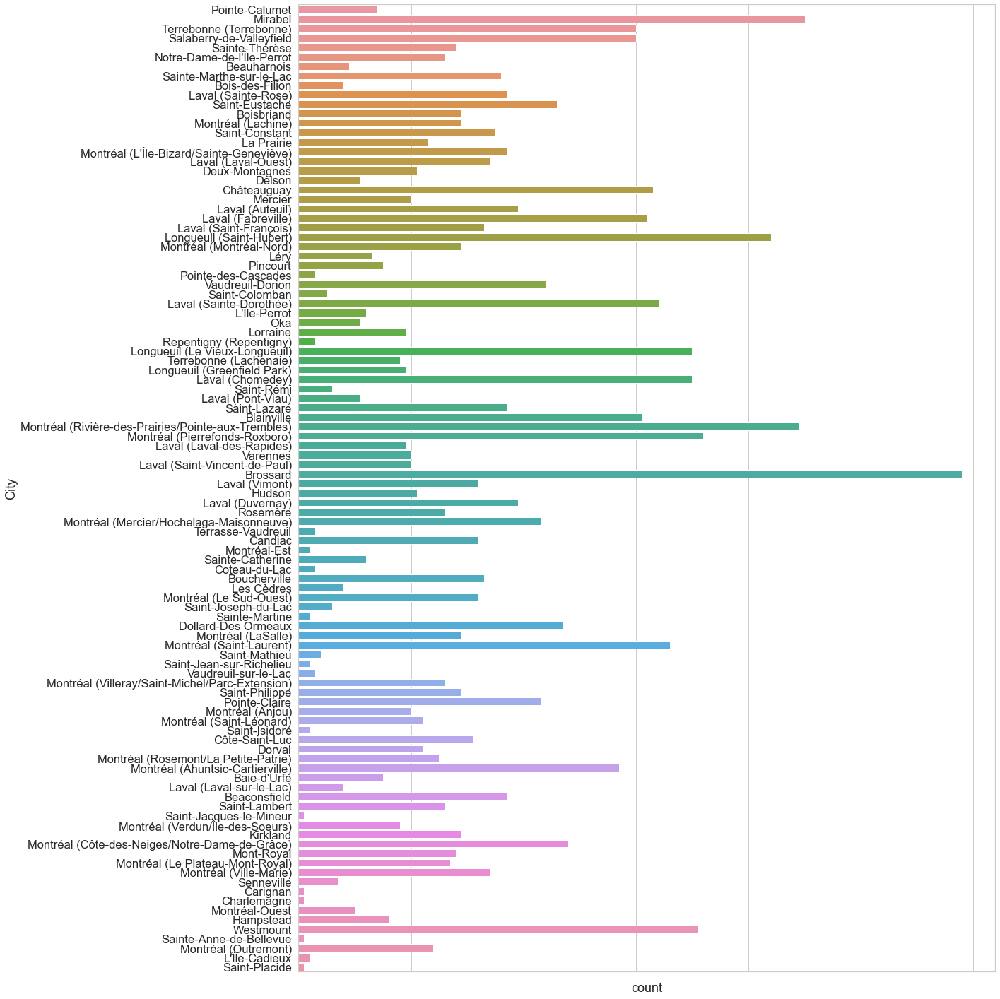

In [194]:
#DATA EXPLORATION

plt.figure(figsize=(20,20)) 
ax = sns.countplot(y="City", data=df)

ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()
plt.show()

In [195]:
mtl = gpd.read_file("/Users/nicomorales/Desktop/datasets/limadmin-shp (1)/LIMADMIN.shp")
cmm = gpd.read_file("/Users/nicomorales/Desktop/datasets/limite_muni/limite_muni.shp")
laval = gpd.read_file("/Users/nicomorales/Desktop/datasets/limitesdessecteursdamenagement/limites_des_secteurs_d_amenagement.shp")
laval['geometry'] = laval['geometry'].to_crs({'init': 'EPSG:4269'})
cmm['geometry'] = cmm['geometry'].to_crs({'init': 'EPSG:4269'})

/Users/nicomorales/opt/anaconda3/lib/python3.8/site-packages/pyproj/crs/crs.py:68: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


Text(0.5, 1.0, 'Montreal Metropolitan Region')

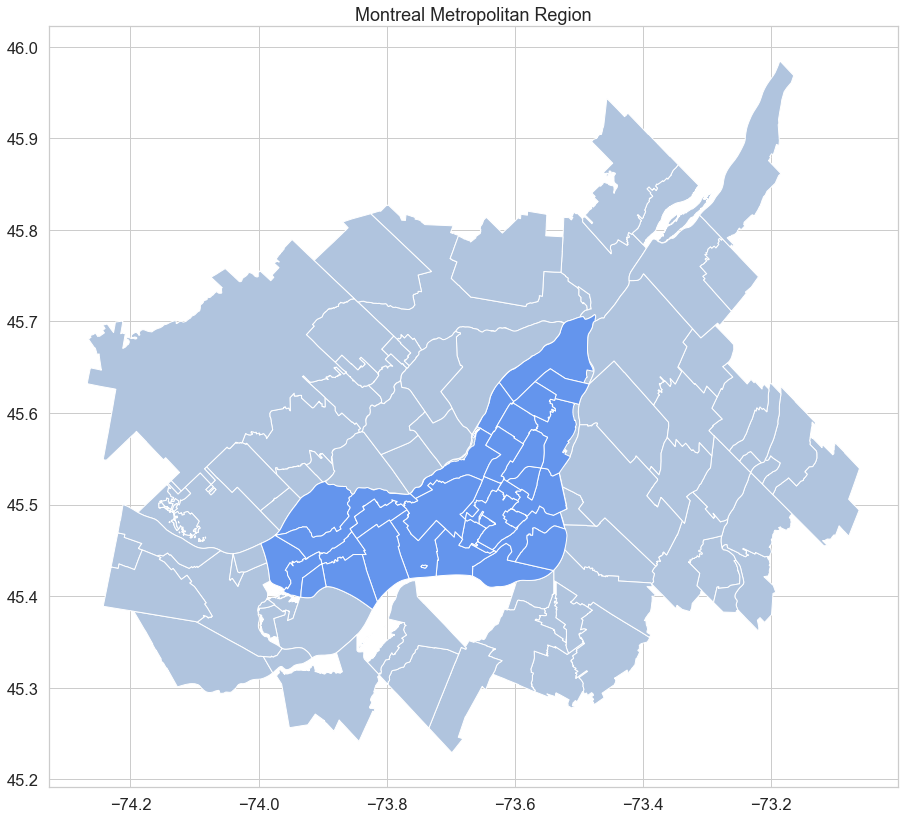

In [196]:
fig, ax = plt.subplots(figsize = (16,14))
cmm.plot(ax=ax, color="lightsteelblue",edgecolor="white")
mtl.plot(ax=ax, color='cornflowerblue', edgecolor='white')
laval.plot(ax=ax, color='lightsteelblue', edgecolor='white')
ax.set_title('Montreal Metropolitan Region')

In [198]:
df['Latitude'] = pd.to_numeric(df['Latitude'],errors='coerce')
df['Longitude'] = pd.to_numeric(df['Longitude'],errors='coerce')

In [200]:
crs = {'init':'EPSG:4326'}
geometry = [Point(xy) for xy in zip(df['Longitude'], df['Latitude'])]
df_geo = gpd.GeoDataFrame(df, 
                          crs = crs, 
                          geometry = geometry)

Text(0.5, 1.0, 'Houses For Sale in Montreal Metropolitan Region')

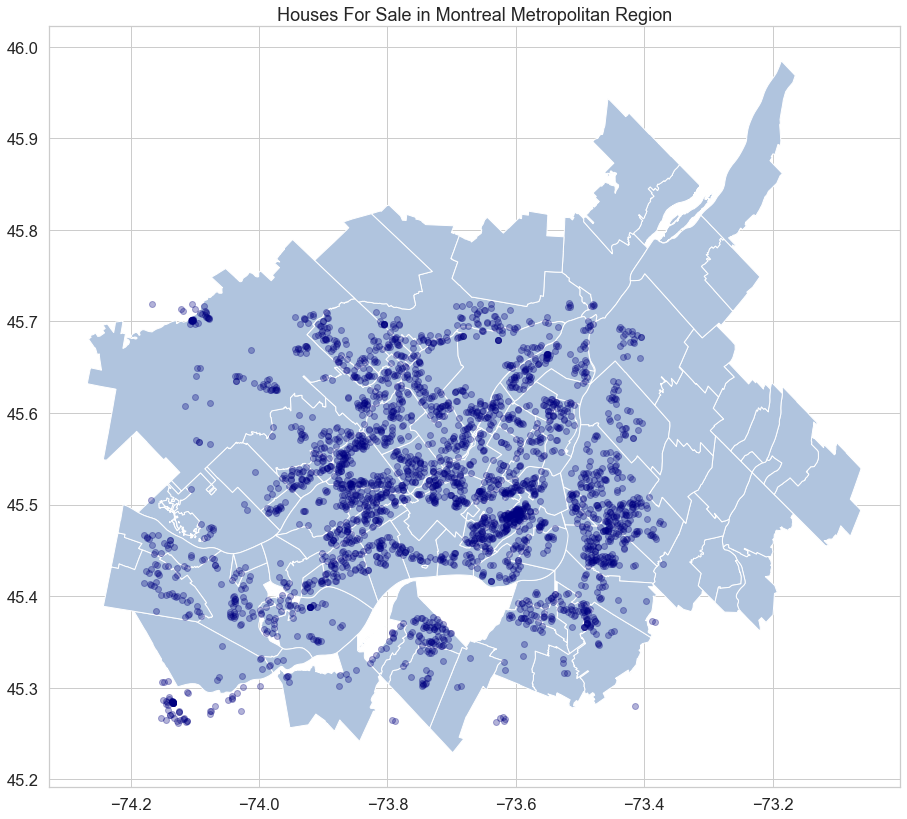

In [202]:
fig, ax = plt.subplots(figsize = (16,14))
cmm.plot(ax=ax, color="lightsteelblue",edgecolor="white")
mtl.plot(ax=ax, color='lightsteelblue', edgecolor='white')
laval.plot(ax=ax, color='lightsteelblue', edgecolor='white')
df_geo.plot(ax=ax, color="navy",alpha=0.3)
ax.set_title('Houses For Sale in Montreal Metropolitan Region')

In [204]:
df_proc = df.copy()

In [205]:
df_proc = df[df['Price1'] < 5000000]

/Users/nicomorales/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/nicomorales/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


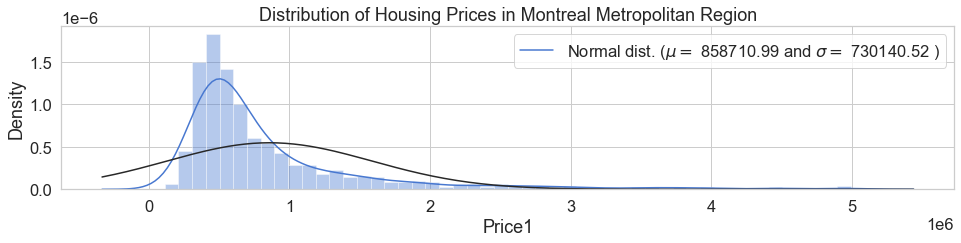

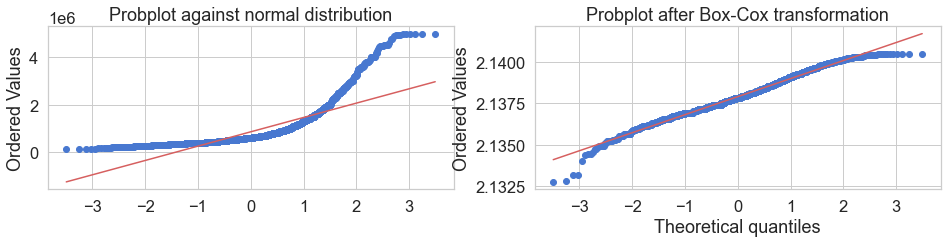

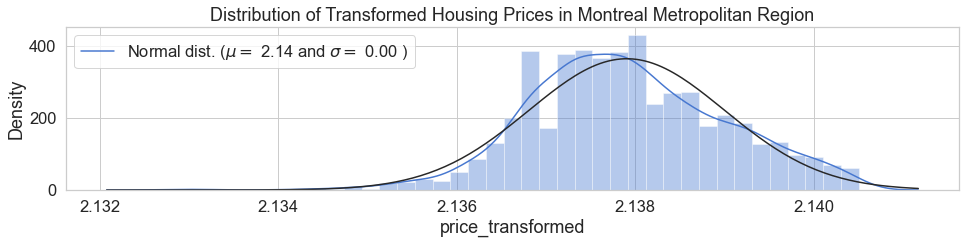

In [208]:
plt.figure(4, figsize=[16,3])

sns.distplot(df_proc['Price1'], fit=stats.norm)
plt.title('Distribution of Housing Prices in Montreal Metropolitan Region')
(mu, sigma) = stats.norm.fit(df_proc['Price1'])
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')

plt.figure(5, figsize=[16,3])

ax3=plt.subplot(1,2,1)
x = df_proc['Price1']
stats.probplot(x, dist=stats.norm, plot=ax3)
ax3.set_xlabel('')
ax3.set_title('Probplot against normal distribution')


ax4=plt.subplot(1,2,2)
boxcox_lambda = stats.boxcox_normmax(x, brack=(-1.9, 2.0),  method='mle')
transformed_array = stats.boxcox(x, boxcox_lambda)
stats.probplot(transformed_array, dist=stats.norm , plot=ax4)
ax4.set_title('Probplot after Box-Cox transformation')
df_proc['price_transformed'] = transformed_array

plt.figure(6, figsize=[16,3])
sns.distplot(df_proc['price_transformed'], fit=stats.norm)
plt.title('Distribution of Transformed Housing Prices in Montreal Metropolitan Region')
(mu, sigma) = stats.norm.fit(df_proc['price_transformed'])
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')


df_proc['price_log']= np.log(df_proc['Price1'])

plt.show()

In [210]:
import json
from bokeh.io import output_notebook, show, output_file
from bokeh.plotting import figure
from bokeh.models import GeoJSONDataSource, LinearColorMapper, ColorBar
from bokeh.models.glyphs import MultiLine
from bokeh.models import Cross,NumeralTickFormatter
from bokeh.palettes import brewer
from bokeh.models import Label, HoverTool, AjaxDataSource
from bokeh.models import ColumnDataSource
#Read data to json.
cmm_geo_json = json.loads(cmm.to_json())
mtl_geo_json = json.loads(mtl.to_json())
laval_geo_json = json.loads(laval.to_json())
#Convert to String like object.
cmm_data = json.dumps(cmm_geo_json)
mtl_data = json.dumps(mtl_geo_json)
laval_data = json.dumps(laval_geo_json)

#Input GeoJSON source that contains features for plotting.
cmmsource = GeoJSONDataSource(geojson = cmm_data)
mtlsource = GeoJSONDataSource(geojson = mtl_data)
lavalsource = GeoJSONDataSource(geojson = laval_data)


p = figure(title = 'MTL housing prices', plot_height = 680 , plot_width = 950,
          active_scroll='wheel_zoom')
p.xgrid.grid_line_color = None
p.ygrid.grid_line_color = None



p.patches('xs','ys', source = cmmsource,
          line_color = 'white', line_width = 0.25, fill_alpha = 1)
p.patches('xs','ys', source = mtlsource,
          line_color = 'white', line_width = 0.25, fill_alpha = 1)
p.patches('xs','ys', source = lavalsource,
          line_color = 'white', line_width = 0.25, fill_alpha = 1)



# Add houses to the map
palette = brewer['Spectral'][11] #[::-1]
color_mapper = LinearColorMapper(palette = palette,
                                 low = df_proc['price_log'].min(),
                                 high = df_proc['price_log'].max())
df_proc = df_proc.drop(columns=['geometry'])
geosource_2 = AjaxDataSource(df_proc)
p1 = p.circle('Longitude', 'Latitude', alpha=0.6, radius=0.0025, color={'field': 'price_log', 'transform': color_mapper}, source=geosource_2)



#Define custom tick labels for color bar.
tick_labels = {'12':'200K','13':'488K','14':'1.33M','15':'4.000M'}

#Create color bar 
color_bar = ColorBar(color_mapper=color_mapper, label_standoff=8,width = 500, height = 15,
border_line_color=None,location = (0,0), orientation = 'horizontal', major_label_overrides = tick_labels)


#Add hover tool
#hover = HoverTool(renderers=[p1],
                     #tooltips =[('District','@city_district'),
                               #('District Income', '$ @mean_district_income{0,0}'), 
                               #('Price','$ @final_price{0,0}'),
                               #('Type', '@type'),
                               #('MLS','@mls')])
#p.add_tools(hover)

#Specify figure layout.
p.add_layout(color_bar, 'below')

#Display figure in Jupyter Notebook.
output_notebook()

#Display figure.
show(p)

Loading BokehJS ...

In [211]:
p = figure(title = 'Household Median Income', plot_height = 680 , plot_width = 950,
          active_scroll='wheel_zoom')
p.xgrid.grid_line_color = None
p.ygrid.grid_line_color = None



p.patches('xs','ys', source = cmmsource,
          line_color = 'white', line_width = 0.25, fill_alpha = 1)
p.patches('xs','ys', source = mtlsource,
          line_color = 'white', line_width = 0.25, fill_alpha = 1)
p.patches('xs','ys', source = lavalsource,
          line_color = 'white', line_width = 0.25, fill_alpha = 1)



# Add houses to the map
palette = brewer['Spectral'][11] #[::-1]
color_mapper = LinearColorMapper(palette = palette,
                                 low = df_proc['median_income'].min(),
                                 high = df_proc['median_income'].max())

geosource_2 = AjaxDataSource(df_proc)
p1 = p.circle('Longitude', 'Latitude', alpha=0.6, radius=0.0025, color={'field': 'median_income', 'transform': color_mapper}, source=geosource_2)



#Define custom tick labels for color bar.
#tick_labels = {'12':'200K','13':'488K','14':'1.33M','15':'4.000M'}

#Create color bar 
color_bar = ColorBar(color_mapper=color_mapper, label_standoff=8,width = 500, height = 15,
border_line_color=None,location = (0,0), orientation = 'horizontal', major_label_overrides = tick_labels)


#Add hover tool
#hover = HoverTool(renderers=[p1],
                     #tooltips =[('District','@city_district'),
                               #('District Income', '$ @mean_district_income{0,0}'), 
                               #('Price','$ @final_price{0,0}'),
                               #('Type', '@type'),
                               #('MLS','@mls')])
#p.add_tools(hover)

#Specify figure layout.
p.add_layout(color_bar, 'below')

#Display figure in Jupyter Notebook.
output_notebook()

#Display figure.
show(p)

Loading BokehJS ...

In [212]:
average_median = df.groupby('City', as_index=False)['median_income'].mean()
average_median = average_median.sort_values('median_income',ascending=False)
average_median.head(20)

,City,median_income
101,Westmount,191270.070423
1,Beaconsfield,123392.000000
45,Mont-Royal,102312.785714
74,Rosemère,101036.400000
37,Les Cèdres,98387.000000
83,Saint-Lazare,97914.729730
6,Boucherville,97401.000000
49,Montréal (L'Île-Bizard/Sainte-Geneviève),93344.324324
35,Laval (Sainte-Rose),92672.000000
3,Blainville,92025.081967


In [213]:
average_price = df.groupby(['City'])['Price1'].mean().reset_index()
average_price = average_price.sort_values("Price1", ascending=False)
average_price.head(20)

,City,Price1
86,Saint-Placide,4.950000e+06
101,Westmount,4.518770e+06
63,Montréal (Ville-Marie),4.368078e+06
56,Montréal (Outremont),3.189875e+06
21,L'Île-Cadieux,3.050000e+06
45,Mont-Royal,2.314457e+06
18,Hampstead,2.056125e+06
19,Hudson,1.927059e+06
94,Senneville,1.823714e+06
1,Beaconsfield,1.644564e+06


In [278]:
df_edited = df.copy()

In [279]:
del df_edited["Address"]
del df_edited["City"]
del df_edited["geometry"]
del df_edited["postal_area"]
del df_edited["Postal_Code"]

In [280]:
df_edited['Bathrooms'] = df_edited['Bathrooms'].astype(int)
df_edited['Bedrooms'] = df_edited['Bedrooms'].astype(int)
df_edited = df_edited[df_edited['median_income'].notna()] # removing rows with nan values

In [281]:
df_edited.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2907 entries, 0 to 4490
Data columns (total 10 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Latitude                2907 non-null   float64
 1   Longitude               2907 non-null   float64
 2   Bathrooms               2907 non-null   int64  
 3   Bedrooms                2907 non-null   int64  
 4   off or on island?       2907 non-null   int64  
 5   distance from downtown  2907 non-null   float64
 6   Price1                  2907 non-null   float64
 7   Area1                   2907 non-null   float64
 8   median_income           2907 non-null   float64
 9   population              2907 non-null   float64
dtypes: float64(7), int64(3)
memory usage: 249.8 KB


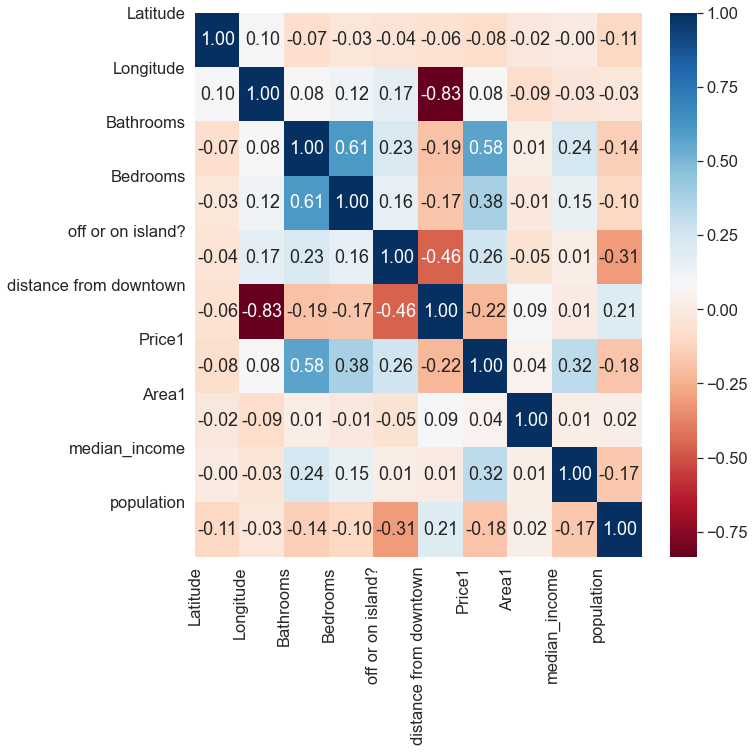

In [282]:
corr = df_edited.corr()
#Plot figsize
fig, ax = plt.subplots(figsize=(10, 10))
#Generate Heat Map, allow annotations and place floats in map
sns.heatmap(corr, cmap='RdBu', annot=True, fmt=".2f")
#Apply xticks
plt.xticks(range(len(corr.columns)), corr.columns);
#Apply yticks
plt.yticks(range(len(corr.columns)), corr.columns)
#show plot
plt.show()

In [283]:
from sklearn.model_selection import train_test_split
train,test = train_test_split(df_edited,test_size=0.33,random_state=42)

In [284]:
df_edited.info()
df_edited.isnull().any()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2907 entries, 0 to 4490
Data columns (total 10 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Latitude                2907 non-null   float64
 1   Longitude               2907 non-null   float64
 2   Bathrooms               2907 non-null   int64  
 3   Bedrooms                2907 non-null   int64  
 4   off or on island?       2907 non-null   int64  
 5   distance from downtown  2907 non-null   float64
 6   Price1                  2907 non-null   float64
 7   Area1                   2907 non-null   float64
 8   median_income           2907 non-null   float64
 9   population              2907 non-null   float64
dtypes: float64(7), int64(3)
memory usage: 249.8 KB


Latitude                  False
Longitude                 False
Bathrooms                 False
Bedrooms                  False
off or on island?         False
distance from downtown    False
Price1                    False
Area1                     False
median_income             False
population                False
dtype: bool

In [285]:
x_train = train.drop('Price1',axis=1)
y_train = train.Price1

In [286]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(x_train,y_train)
model.score(x_train,y_train)

0.45410898636466923